# Home Loan Approval

## Business Understanding

Purpose: 
      
      Classify customer loans as approved or denied.

Industry: 
      
      Banking and Finance - institutions like banks, credit unions, and home mortgage lenders

Uses:   
     
     Identify applicants that represent a good loan risk and can therefore be approved for a home loan; or in the alternative, applicants most likely to default on a loan and therefore should be denied a home loan.
     
     Quick and accurate loan application processing
     
     Consistent decision-making across all loan applications
     
     Reduction of bias in the approval process


## Data Understanding

Data source:

    Dream Housing Financing Company (DHFC) found at https://www.kaggle.com/datasets/rishikeshkonapure/home-loan-approval.

Features:

     Loan_ID: The bank provided ID number for the loan request
     
     Gender: String variable indicating Gender of the primary applicant
     
     Married: String variable indicating marital status of primary applicant.
     
     Dependents: The number of dependents of the primary applicant.
     
     Education: String variable indicating whether primary applicant graduated or not.
     
     Self_Employed: String Variable indicating whether primary applicant is self employed or not.
     
     ApplicantIncome: The income of the primary applicant.
     
     CoapplicantIncome: The income of the co-applicant.
     
     LoanAmount: The amount (in thousands) the applicant wants to borrow.
     
     Loan_Amount_Term: The term (in months) in which the applicant will repay the loan
     
     Credit_History: Binary variable representing whether applicant's credit history is good or bad
     
     Property_Area: Categorical variable indcating the type of area the applicant is from

Labels: 
     
     Loan_Status: String variable indciating whether the loan was approved or denied



### Import libraries and load data

The given dataset is already split. Both files will be loaded into seperate dataframes. 'loan_sanction_train.csv' will be used as the training set, and 'loan_sanction_test.csv' will be used as the hold-out test set.

In [1]:
import pandas as pd
from pandas_profiling import ProfileReport
import numpy as np
from sklearn.model_selection import train_test_split, RandomizedSearchCV, StratifiedKFold
from sklearn.model_selection import GridSearchCV
import seaborn as sns
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
from sklearn.metrics import mean_squared_error,confusion_matrix
from sklearn.metrics import auc,roc_curve, accuracy_score, classification_report
from sklearn.model_selection import cross_val_score
from sklearn import model_selection
import matplotlib.pyplot as plt
%matplotlib inline


# Load data
df = pd.read_csv('./data/loan_sanction_train.csv')
df_holdout = pd.read_csv('./data/loan_sanction_test.csv')

/var/folders/cz/dztysmpn7sgfqcz6vr1t0vs00000gp/T/ipykernel_58306/3717088874.py:2: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  from pandas_profiling import ProfileReport


### Exploratory Data Analysis (EDA)

For developing this model we will explore the df dataframe containing the training data from the file 'loan_sanction_train.csv'.

In [3]:
# Dataframe shape
print('Dataframe shape:')
print(df.shape)

Dataframe shape:
(614, 13)


Looking at the shape of the dataframe we find 614 rows and 13 columns

#### Univariate Analysis

In [4]:
#Basic info
print('Basic Info:')
print(df.info())
print(' ')

Basic Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 614 entries, 0 to 613
Data columns (total 13 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Loan_ID            614 non-null    object 
 1   Gender             601 non-null    object 
 2   Married            611 non-null    object 
 3   Dependents         599 non-null    object 
 4   Education          614 non-null    object 
 5   Self_Employed      582 non-null    object 
 6   ApplicantIncome    614 non-null    int64  
 7   CoapplicantIncome  614 non-null    float64
 8   LoanAmount         592 non-null    float64
 9   Loan_Amount_Term   600 non-null    float64
 10  Credit_History     564 non-null    float64
 11  Property_Area      614 non-null    object 
 12  Loan_Status        614 non-null    object 
dtypes: float64(4), int64(1), object(8)
memory usage: 62.5+ KB
None
 


From this information we find the names of all of the feature columns. 
The features are made up of three data types: object, float64, and int64. 
This informs us that we have both categorical and numerical data making up this dataframe.
Also, we find that some of our columns have missing data producing null values.

In [7]:
df.Loan_Status

0      Y
1      N
2      Y
3      Y
4      Y
      ..
609    Y
610    Y
611    Y
612    Y
613    N
Name: Loan_Status, Length: 614, dtype: object

This feature column gives us the decision from the application:
Y = approved and N = declined. 
This feature is the target variable.

#### Splitting the data

Make 'Loan_Status' the target variable y. Split the data into train and test sets. 

In [ ]:
y = df['Loan_Status']
X = df.drop(['Loan_Status'], axis=1)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25, random_state = 42)

In [5]:
#Find null Values

df.isnull().sum(axis=0)

Loan_ID               0
Gender               13
Married               3
Dependents           15
Education             0
Self_Employed        32
ApplicantIncome       0
CoapplicantIncome     0
LoanAmount           22
Loan_Amount_Term     14
Credit_History       50
Property_Area         0
Loan_Status           0
dtype: int64

Here, the number of null values for each feature column is given. The missing values will be addressed during the preprocessing stage. 

In [4]:
list(zip(df.columns, df.nunique()))

[('Loan_ID', 614),
 ('Gender', 2),
 ('Married', 2),
 ('Dependents', 4),
 ('Education', 2),
 ('Self_Employed', 2),
 ('ApplicantIncome', 505),
 ('CoapplicantIncome', 287),
 ('LoanAmount', 203),
 ('Loan_Amount_Term', 10),
 ('Credit_History', 2),
 ('Property_Area', 3),
 ('Loan_Status', 2)]

Here the number of unique values for each feature column is given

In [9]:
# Describe the data
print('Descriptive Statistics:')
print(df.describe())
print('')

Descriptive Statistics:
       ApplicantIncome  CoapplicantIncome  LoanAmount  Loan_Amount_Term  \
count       614.000000         614.000000  592.000000         600.00000   
mean       5403.459283        1621.245798  146.412162         342.00000   
std        6109.041673        2926.248369   85.587325          65.12041   
min         150.000000           0.000000    9.000000          12.00000   
25%        2877.500000           0.000000  100.000000         360.00000   
50%        3812.500000        1188.500000  128.000000         360.00000   
75%        5795.000000        2297.250000  168.000000         360.00000   
max       81000.000000       41667.000000  700.000000         480.00000   

       Credit_History  
count      564.000000  
mean         0.842199  
std          0.364878  
min          0.000000  
25%          1.000000  
50%          1.000000  
75%          1.000000  
max          1.000000  



ApplicantIncome, CoapplicantIncome, LoanAmount:
These feature show a range of numbers with low minimums for each feature and high maximums. The maximum number is very far from the 3rd quartile value of each of these features indicating an outlier.

huge range of numbers may be a result of outliers. 

Credit_History: 
Has only two values. Here we see they are 0 and 1. 

Loan_Amount_Term:
This feature is uniform at all three quartiles with a relatively low number as the minimum and a somewhat higher number as the max.

We will develop graphs for these features for further inspection. (Note: Although some graphs show two features at the same time, each feature is assessed separately and does not indicate any comparison or relationship between the two)

<AxesSubplot:>

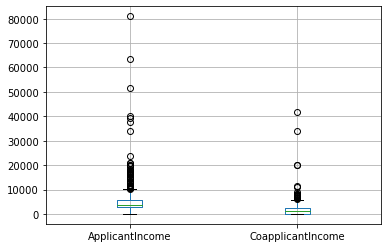

In [10]:
df[['ApplicantIncome', 'CoapplicantIncome']].boxplot()

In the distribution of ApplicantIncome and CoapplicantIncome there are several outliers above the median of these variable. 

<AxesSubplot:>

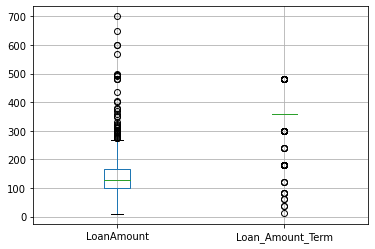

In [12]:
df[['LoanAmount', 'Loan_Amount_Term']].boxplot()

For LoanAmount we see there are outliers above the median. For Loan_Amount_Term, although it may seem at first glance that the distribution is not a tight one, this graph demonstrates that the interquartile range is very tight as the the first and third qurtile are both equal to the median.

1.0    475
0.0     89
Name: Credit_History, dtype: int64


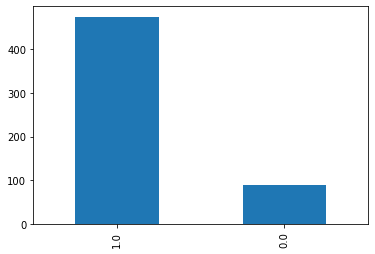

In [25]:
df.Credit_History.value_counts().plot(kind='bar')
print(df.Credit_History.value_counts())

'Credit_History' has no outliers, but it does contain a data imbalance between its  two values. Though not a major imbalance 

Y    422
N    192
Name: Loan_Status, dtype: int64


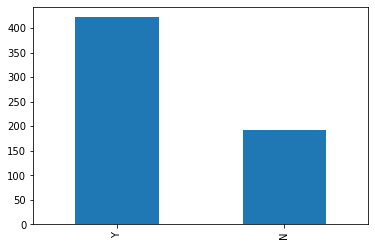

In [27]:
df.Loan_Status.value_counts().plot(kind='bar')
print(df.Loan_Status.value_counts())

There is a 'mild' data imbalance in our target variable with the proportion of our Minority Class being approximately 31 percent.

#### Bivariate and multivariate analysis

Compare each variable to Loan_Status to show relationship/effect of variable on Loan_Status:



Loan_Status    N    Y
Gender               
Female        37   75
Male         150  339


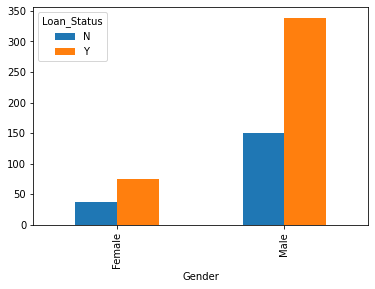

In [26]:
crossGender = pd.crosstab(df.Gender, df.Loan_Status)
crossGender.plot.bar()
print(pd.crosstab(df.Gender.sort_values(ascending=False), df.Loan_Status))

There is a small difference in loan approval between male (69%) and female (67%) and also in loan denial between male (31%) and female (33%). Also, there is a visible data imbalance in number between the two types of applicants. However, the denials and approvals  for both male and female are pretty much the same in terms of loan status and have no significant effect on whether the loan application is approved or denied. 
   
   (Note: Because of the lower percentage of approvals for female (and the higher percentage of denials for female) discovered in this analysis, there may be need for further inspection to determine if these outcomes are significant enough to indicate bias.) 

Loan_Status    N    Y
Married              
No            79  134
Yes          113  285


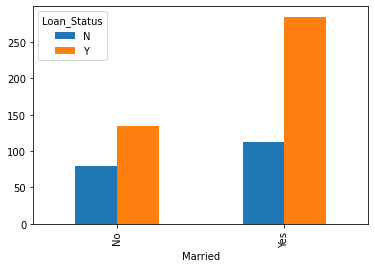

In [8]:
crossMarried = pd.crosstab(df.Married, df.Loan_Status)
crossMarried.plot.bar()
print(pd.crosstab(df.Married.sort_values(ascending=False), df.Loan_Status))

Loan_Status    N    Y
Dependents           
0            107  238
1             36   66
2             25   76
3+            18   33


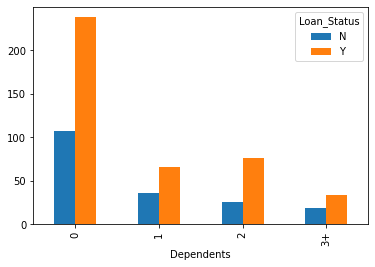

In [9]:
crossDependents = pd.crosstab(df.Dependents, df.Loan_Status)
crossDependents.plot.bar()
print(pd.crosstab(df.Dependents.sort_values(ascending=False), df.Loan_Status))

Loan_Status     N    Y
Education             
Graduate      140  340
Not Graduate   52   82


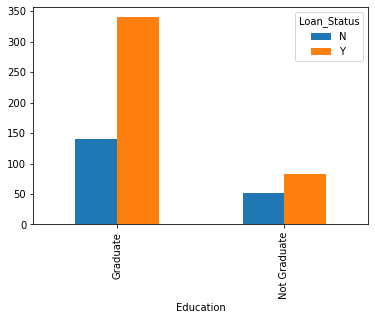

In [10]:
crossEducation = pd.crosstab(df.Education, df.Loan_Status)
crossEducation.plot.bar()
print(pd.crosstab(df.Education.sort_values(ascending=False), df.Loan_Status))

Loan_Status      N    Y
Self_Employed          
No             157  343
Yes             26   56


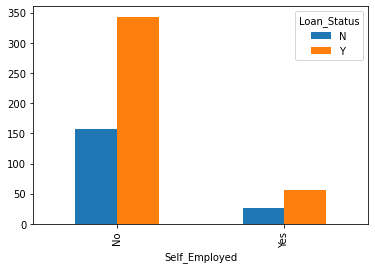

In [11]:
crossEmploy = pd.crosstab(df.Self_Employed, df.Loan_Status)
crossEmploy.plot.bar()
print(pd.crosstab(df.Self_Employed.sort_values(ascending=False), df.Loan_Status))

Loan_Status     N    Y
Property_Area         
Rural          69  110
Semiurban      54  179
Urban          69  133


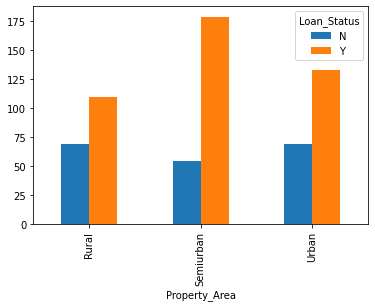

In [12]:
crossArea = pd.crosstab(df.Property_Area, df.Loan_Status)
crossArea.plot.bar()
print(pd.crosstab(df.Property_Area.sort_values(ascending=False), df.Loan_Status))

Loan_Status         N    Y
Loan_Amount_Term          
12.0                0    1
36.0                2    0
60.0                0    2
84.0                1    3
120.0               0    3
180.0              15   29
240.0               1    3
300.0               5    8
360.0             153  359
480.0               9    6


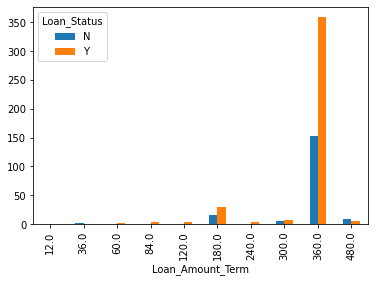

In [13]:
crossTerm = pd.crosstab(df.Loan_Amount_Term, df.Loan_Status)
crossTerm.plot.bar()
print(pd.crosstab(df.Loan_Amount_Term.sort_values(ascending=False), df.Loan_Status))

Loan_Status  N  Y
LoanAmount       
9.0          1  0
17.0         0  1
25.0         0  2
26.0         0  1
30.0         0  2
...         .. ..
500.0        1  0
570.0        1  0
600.0        0  2
650.0        0  1
700.0        0  1

[203 rows x 2 columns]


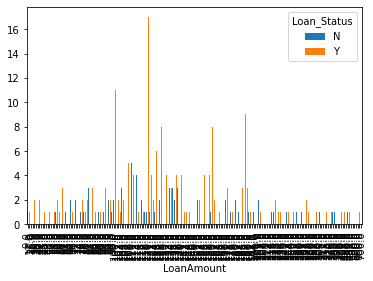

In [14]:
crossAmount = pd.crosstab(df.LoanAmount, df.Loan_Status)
crossAmount.plot.bar()
print(pd.crosstab(df.LoanAmount.sort_values(ascending=False), df.Loan_Status))

For the bivariate graphs  of the features Married, Dependents, Education, Self_Employed, Property_Area, Loan_Amount_Term, and LoanAmount  compared against Loan_Status, there is no signicant impact on the approval or denial of an application based on any one of these distinct features.

Loan_Status      N  Y
ApplicantIncome      
150              1  0
210              0  1
416              1  0
645              0  1
674              0  1
...             .. ..
39147            0  1
39999            0  1
51763            0  1
63337            0  1
81000            1  0

[505 rows x 2 columns]


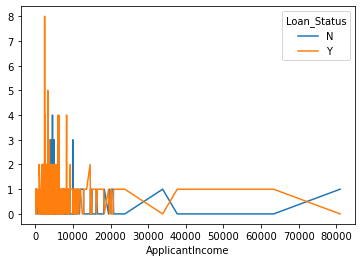

In [30]:
crossApplicant = pd.crosstab(df.ApplicantIncome, df.Loan_Status)
crossApplicant.plot.line()
print(pd.crosstab(df.ApplicantIncome.sort_values(ascending=False), df.Loan_Status))

Loan_Status         N    Y
CoapplicantIncome         
0.000000           96  177
16.120001           0    1
189.000000          0    1
240.000000          0    1
242.000000          0    1
...                ..  ...
10968.000000        1    0
11300.000000        1    0
20000.000000        1    1
33837.000000        1    0
41667.000000        1    0

[287 rows x 2 columns]


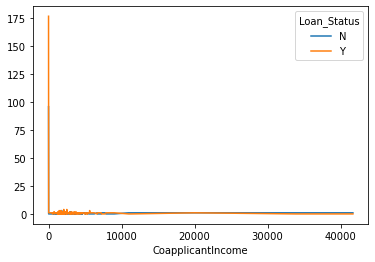

In [31]:
crossCoapplicant = pd.crosstab(df.CoapplicantIncome, df.Loan_Status)
crossCoapplicant.plot.line()
print(pd.crosstab(df.CoapplicantIncome.sort_values(ascending=False), df.Loan_Status))

In [ ]:
df[['Credit_History', 'LoanAmount', 'Loan_Amount_Term', 'ApplicantIncome', 'CoapplicantIncome']].boxplot()

Looking at all the features Credit_History', 'LoanAmount', 'Loan_Amount_Term', 'ApplicantIncome', and 'CoapplicantIncome at once, we see the two variables ApplicantIncome and CoapplicantIncome have a very high order of magnitude when compared to the other numeric variables. We know that the rangge of values in these features starts at zero and goea no higher than 1.0 for at least one feature and extends in to the hundreds of thousands for others. there are also categorical features (that we will deal with later) to consider. For these reasons, we will need to do some feature scaling to normalise this dataset.

Because of the number of applicants these graphs show us very little.

Loan_Status      N    Y
Credit_History         
0.0             82    7
1.0             97  378


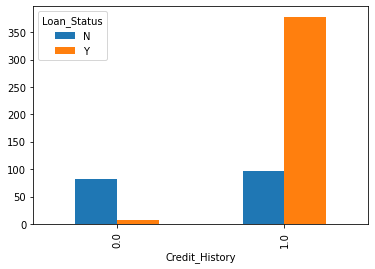

In [15]:
crossCredit = pd.crosstab(df.Credit_History, df.Loan_Status)
crossCredit.plot.bar()
print(pd.crosstab(df.Credit_History.sort_values(ascending=False), df.Loan_Status))

There is a visible difference when comparing the approvals and denials of applicants when based on Credit_History. Accordingly, this feature clearly has a significant impact on whether a loan application is approved or denied. Also, we notice a data imbalance in this feature. because of the clear importance of this feature, a technique to handle this imbalance (and others), will be employed to avoid creating a bias towards 1.0 which represents good credit.

<AxesSubplot:>

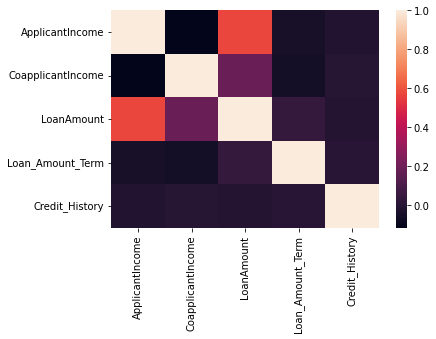

In [17]:
# Heatmap showing distributiions and correlations of features
sns.heatmap(df.corr())

The heat map shows strong correlations between the pairings of ApplicantIncome - LoanAmount; Credit_History - Loan_Status. 

## Data Preparation and Modeling

### Preprocessing

In [23]:
# Loan_ID offers no significant data so it is dropped nd our dataset variables are renamed
X_train1 = X_train.drop(['Loan_ID'], axis=1)
y_train1 = y_train

In [24]:
# Create preprocessing
# Replace null values for each numeric variable with median
# and scale the values for each variable 
num_cols = ['LoanAmount', 'Loan_Amount_Term', 'ApplicantIncome', 'CoapplicantIncome']
num_transformer = Pipeline(steps=[('imputer', SimpleImputer(strategy ='median')), ('scaler', StandardScaler())])

# Credit_History needs its own transformer to use mode instead of median 
# because median gives us an undefined decimal of 0.5
ch_col = ['Credit_History']
ch_transformer = SimpleImputer(strategy = 'most_frequent')

# Replace null values for each categorical variable with 'most_frequent'
# and OneHotEncode values of the variables
cat_cols = ['Gender', 'Married', 'Dependents', 'Self_Employed', 'Education', 'Property_Area']
cat_transformer = Pipeline(
    steps = [('imputer', SimpleImputer(strategy = 'most_frequent')),
            ('encoder', OneHotEncoder(handle_unknown='ignore'))])
preprocessor = ColumnTransformer(
    transformers=[
        ('num', num_transformer, num_cols),
        ('cred_his', ch_transformer, ch_col),
        ('cat', cat_transformer, cat_cols)
    ])
    


Append Classifier to preprocessing pipeline

### Modeling

#### Random Forest Classifier using RandomSearchCV

In [85]:
# Create pipeline
pipe = Pipeline(
    steps=[('preprocessor', preprocessor),
          ('rfc', RandomForestClassifier())])

# Declare rfc hyperparameters distribution
param_dist ={'rfc__n_estimators': [100,200,300,500,700,800,1000],
             'rfc__criterion': ['entropy', 'gini'],
             'rfc__min_samples_split': [2,3,4,5,7,8,9,10],
             'rfc__min_samples_leaf': [1,2,3,4,5],
             'rfc__max_features': ['sqrt', 'log2'],
             'rfc__max_depth':[1,2,3,4,5,6,7],
             'rfc__random_state': [42],
             'rfc__bootstrap': [True, False]
                    }
# Though not severe in any particular category, Because we are using a RandomForest
# classifier, we will address the several data imbalances in this dataset 
# with the ensemble method of StratifiedKFold
kf = StratifiedKFold()

# Create RandomizedSearchCV and find optimal hyperparameters for rfc
rs = RandomizedSearchCV(estimator=pipe, 
                        param_distributions=param_dist,
                        n_iter=100,
                        cv=kf,
                        scoring='accuracy',
                        n_jobs=-1,
                        verbose=2,
                   )
# Fit rs to training data
rs.fit(X_train1, y_train1)


Fitting 5 folds for each of 100 candidates, totalling 500 fits


RandomizedSearchCV(cv=StratifiedKFold(n_splits=5, random_state=None, shuffle=False),
                   estimator=Pipeline(steps=[('preprocessor',
                                              ColumnTransformer(transformers=[('num',
                                                                               Pipeline(steps=[('imputer',
                                                                                                SimpleImputer(strategy='median')),
                                                                                               ('scaler',
                                                                                                StandardScaler())]),
                                                                               ['LoanAmount',
                                                                                'Loan_Amount_Term',
                                                                                'ApplicantIncome',
             

In [86]:
# View the best hyperparameters
best_params = rs.best_params_
best_params

{'rfc__random_state': 42,
 'rfc__n_estimators': 100,
 'rfc__min_samples_split': 4,
 'rfc__min_samples_leaf': 4,
 'rfc__max_features': 'log2',
 'rfc__max_depth': 6,
 'rfc__criterion': 'entropy',
 'rfc__bootstrap': True}

In [87]:
# View the best score
best_score = rs.best_score_
best_score

0.8217391304347826

In [88]:
# View score from test set
test_set_score = rs.score(X_test, y_test)
test_set_score

0.7727272727272727

In [89]:
# number of features seen in rs
num_features = rs.n_features_in_
num_features

11

In [90]:
#Names of features seen in rs
feature_names = rs.feature_names_in_
feature_names

array(['Gender', 'Married', 'Dependents', 'Education', 'Self_Employed',
       'ApplicantIncome', 'CoapplicantIncome', 'LoanAmount',
       'Loan_Amount_Term', 'Credit_History', 'Property_Area'],
      dtype=object)

Predict

#### Random Forest Classifier using GridSearchCV

In [26]:
gs = GridSearchCV(estimator=pipe, 
                        param_grid=param_dist,
                        cv=kf,
                        scoring='accuracy',
                        n_jobs=-1,
                        verbose=2
                 )
gs.fit(X_train1, y_train1)

Fitting 5 folds for each of 15680 candidates, totalling 78400 fits
[CV] END rfc__bootstrap=False, rfc__criterion=gini, rfc__max_depth=4, rfc__max_features=log2, rfc__min_samples_leaf=1, rfc__min_samples_split=3, rfc__n_estimators=700, rfc__random_state=42; total time=   0.5s
[CV] END rfc__bootstrap=False, rfc__criterion=entropy, rfc__max_depth=1, rfc__max_features=sqrt, rfc__min_samples_leaf=2, rfc__min_samples_split=2, rfc__n_estimators=700, rfc__random_state=42; total time=   0.5s
[CV] END rfc__bootstrap=False, rfc__criterion=entropy, rfc__max_depth=3, rfc__max_features=sqrt, rfc__min_samples_leaf=1, rfc__min_samples_split=4, rfc__n_estimators=1000, rfc__random_state=42; total time=   0.7s
[CV] END rfc__bootstrap=False, rfc__criterion=entropy, rfc__max_depth=6, rfc__max_features=sqrt, rfc__min_samples_leaf=1, rfc__min_samples_split=5, rfc__n_estimators=1000, rfc__random_state=42; total time=   0.8s
[CV] END rfc__bootstrap=False, rfc__criterion=gini, rfc__max_depth=2, rfc__max_feature

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=None, shuffle=False),
             estimator=Pipeline(steps=[('preprocessor',
                                        ColumnTransformer(transformers=[('num',
                                                                         Pipeline(steps=[('imputer',
                                                                                          SimpleImputer(strategy='median')),
                                                                                         ('scaler',
                                                                                          StandardScaler())]),
                                                                         ['LoanAmount',
                                                                          'Loan_Amount_Term',
                                                                          'ApplicantIncome',
                                                                         

In [27]:
best_gs_params = gs.best_params_

In [28]:
best_gs_score = gs.best_score_

In [29]:
best_gs_params

{'rfc__bootstrap': False,
 'rfc__criterion': 'gini',
 'rfc__max_depth': 7,
 'rfc__max_features': 'sqrt',
 'rfc__min_samples_leaf': 2,
 'rfc__min_samples_split': 2,
 'rfc__n_estimators': 700,
 'rfc__random_state': 42}

In [30]:
best_gs_score

0.8239130434782609

In [31]:
gs_test_score = gs.score(X_test,y_test)
gs_test_score

0.7792207792207793

[CV] END rfc__bootstrap=False, rfc__criterion=gini, rfc__max_depth=7, rfc__max_features=log2, rfc__min_samples_leaf=3, rfc__min_samples_split=4, rfc__n_estimators=1000, rfc__random_state=42; total time=   0.7s
[CV] END rfc__bootstrap=False, rfc__criterion=gini, rfc__max_depth=7, rfc__max_features=log2, rfc__min_samples_leaf=3, rfc__min_samples_split=5, rfc__n_estimators=500, rfc__random_state=42; total time=   0.4s
[CV] END rfc__bootstrap=False, rfc__criterion=gini, rfc__max_depth=7, rfc__max_features=log2, rfc__min_samples_leaf=3, rfc__min_samples_split=5, rfc__n_estimators=800, rfc__random_state=42; total time=   0.6s
[CV] END rfc__bootstrap=False, rfc__criterion=gini, rfc__max_depth=7, rfc__max_features=log2, rfc__min_samples_leaf=3, rfc__min_samples_split=7, rfc__n_estimators=100, rfc__random_state=42; total time=   0.1s
[CV] END rfc__bootstrap=False, rfc__criterion=gini, rfc__max_depth=7, rfc__max_features=log2, rfc__min_samples_leaf=3, rfc__min_samples_split=7, rfc__n_estimators=

Analysis using Pandas Profiling

In [30]:
df_holdout

,Loan_ID,Gender,Married,Dependents,Education,Self_Employed,ApplicantIncome,CoapplicantIncome,LoanAmount,Loan_Amount_Term,Credit_History,Property_Area
0,LP001015,Male,Yes,0,Graduate,No,5720,0,110.0,360.0,1.0,Urban
1,LP001022,Male,Yes,1,Graduate,No,3076,1500,126.0,360.0,1.0,Urban
2,LP001031,Male,Yes,2,Graduate,No,5000,1800,208.0,360.0,1.0,Urban
3,LP001035,Male,Yes,2,Graduate,No,2340,2546,100.0,360.0,NaN,Urban
4,LP001051,Male,No,0,Not Graduate,No,3276,0,78.0,360.0,1.0,Urban
...,...,...,...,...,...,...,...,...,...,...,...,...
362,LP002971,Male,Yes,3+,Not Graduate,Yes,4009,1777,113.0,360.0,1.0,Urban
363,LP002975,Male,Yes,0,Graduate,No,4158,709,115.0,360.0,1.0,Urban
364,LP002980,Male,No,0,Graduate,No,3250,1993,126.0,360.0,NaN,Semiurban
365,LP002986,Male,Yes,0,Graduate,No,5000,2393,158.0,360.0,1.0,Rural


Predict - 

Predictions using both searches follow:

In [92]:
# Run model on hold out data using hyperparameters from RandomSearchCV 
# Create pipeline
predictor_pipe = Pipeline(
    steps=[('preprocessor', preprocessor),
          ('rfc', RandomForestClassifier(random_state=42,
                                         n_estimators=100,
                                         min_samples_split=4,
                                         min_samples_leaf=4,
                                         max_features='log2',
                                         max_depth=6,
                                         criterion='entropy',
                                         bootstrap=True))])
predictor_pipe.fit(X_train1,y_train1)
predictor_pipe.predict(df_holdout)

array(['Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'N', 'Y', 'Y', 'Y', 'Y', 'Y',
       'N', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'N',
       'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'N', 'Y', 'Y', 'Y',
       'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y',
       'Y', 'Y', 'Y', 'N', 'Y', 'Y', 'N', 'Y', 'Y', 'Y', 'Y', 'N', 'Y',
       'Y', 'N', 'N', 'Y', 'N', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y',
       'Y', 'Y', 'N', 'Y', 'N', 'Y', 'N', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y',
       'Y', 'Y', 'Y', 'N', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'N', 'Y', 'Y',
       'Y', 'Y', 'N', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y',
       'N', 'N', 'N', 'Y', 'Y', 'Y', 'N', 'N', 'Y', 'N', 'Y', 'Y', 'Y',
       'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'N', 'Y', 'N',
       'Y', 'Y', 'Y', 'Y', 'N', 'Y', 'Y', 'Y', 'Y', 'Y', 'N', 'Y', 'Y',
       'Y', 'Y', 'Y', 'Y', 'Y', 'N', 'Y', 'Y', 'Y', 'N', 'N', 'Y', 'N',
       'Y', 'Y', 'Y', 'Y', 'N', 'N', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y

In [40]:
# Run model on hold out data using hyperparameters from GridSearchCV
# Create Pipeline
predictor_pipe = Pipeline(
     steps=[('preprocessor',preprocessor),
           ('rfc', RandomForestClassifier(bootstrap=False,
                                           criterion='gini',
                                           max_depth=7,
                                           max_features='sqrt',
                                           min_samples_leaf=2,
                                           min_samples_split=2,
                                           n_estimators=700,
                                           random_state=42))])

predictor_pipe.fit(X_train1,y_train1)
predictor_pipe.predict(df_holdout)

array(['Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'N', 'Y', 'Y', 'Y', 'Y', 'Y',
       'N', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'N',
       'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'N', 'Y', 'Y', 'Y',
       'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y',
       'Y', 'Y', 'Y', 'N', 'Y', 'Y', 'N', 'Y', 'Y', 'Y', 'Y', 'N', 'Y',
       'Y', 'N', 'N', 'Y', 'N', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y',
       'Y', 'Y', 'N', 'Y', 'N', 'Y', 'N', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y',
       'Y', 'Y', 'Y', 'N', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'N', 'Y', 'Y',
       'Y', 'Y', 'N', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y',
       'N', 'N', 'N', 'Y', 'Y', 'Y', 'N', 'N', 'Y', 'N', 'Y', 'Y', 'Y',
       'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'N', 'Y', 'N',
       'Y', 'Y', 'Y', 'Y', 'N', 'Y', 'Y', 'Y', 'Y', 'Y', 'N', 'Y', 'Y',
       'Y', 'Y', 'Y', 'Y', 'Y', 'N', 'Y', 'Y', 'Y', 'N', 'N', 'Y', 'N',
       'N', 'Y', 'Y', 'Y', 'N', 'N', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y

#### Logistic Regression using RandomSearchCV

In [79]:
pipe2 = Pipeline(
    steps=[('preprocessor', preprocessor),
          ('lr', LogisticRegression())])

# Declare rfc hyperparameters distribution
params ={'lr__solver': ['lbgfgs', 'liblinear', 'sag', 'saga'],
        'lr__random_state': [42],
        'lr__penalty': [None, 'l1', 'l2', 'elasticnet'],
        'lr__C': [0.001, 0.01, 0.1, 1, 2, 3, 4, 10],
        'lr__max_iter': [100, 200, 300, 500]
        }
# Though not severe in any particular category, Because we are using a RandomForest
# classifier, we will address the several data imbalances in this dataset 
# with the ensemble method of StratifiedKFold
kf = StratifiedKFold()

# Create RandomizedSearchCV and find optimal hyperparameters for rfc
rs2 = RandomizedSearchCV(estimator=pipe2, 
                        param_distributions=params,
                        n_iter=100,
                        cv=kf,
                        scoring='accuracy',
                        n_jobs=-1,
                        verbose=2,
                   )
# Fit rs to training data
rs2.fit(X_train1, y_train1)


Fitting 5 folds for each of 100 candidates, totalling 500 fits


/Users/malmahdi/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/malmahdi/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/malmahdi/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/malmahdi/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/malmahdi/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/malmahdi/opt/anaconda3/lib/p

[CV] END lr__C=0.001, lr__penalty=None, lr__random_state=42, lr__solver=liblinear; total time=   0.0s
[CV] END lr__C=0.001, lr__penalty=l1, lr__random_state=42, lr__solver=lbgfgs; total time=   0.0s
[CV] END lr__C=0.001, lr__penalty=l1, lr__random_state=42, lr__solver=sag; total time=   0.0s
[CV] END lr__C=0.001, lr__penalty=l1, lr__random_state=None, lr__solver=liblinear; total time=   0.0s
[CV] END lr__C=0.001, lr__penalty=l2, lr__random_state=42, lr__solver=lbgfgs; total time=   0.0s
[CV] END lr__C=0.001, lr__penalty=l2, lr__random_state=42, lr__solver=lbgfgs; total time=   0.0s
[CV] END lr__C=0.001, lr__penalty=l2, lr__random_state=None, lr__solver=liblinear; total time=   0.0s
[CV] END lr__C=0.001, lr__penalty=l2, lr__random_state=None, lr__solver=liblinear; total time=   0.0s
[CV] END lr__C=0.01, lr__penalty=None, lr__random_state=42, lr__solver=liblinear; total time=   0.0s
[CV] END lr__C=0.01, lr__penalty=None, lr__random_state=42, lr__solver=liblinear; total time=   0.0s
[CV] 

/Users/malmahdi/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/malmahdi/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/malmahdi/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/malmahdi/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/malmahdi/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/malmahdi/opt/anaconda3/lib/p

e=42, lr__solver=sag; total time=   0.0s
[CV] END lr__C=10, lr__penalty=l1, lr__random_state=42, lr__solver=saga; total time=   0.0s
[CV] END lr__C=10, lr__penalty=l2, lr__random_state=42, lr__solver=sag; total time=   0.0s
[CV] END lr__C=10, lr__penalty=elasticnet, lr__random_state=42, lr__solver=liblinear; total time=   0.0s
[CV] END lr__C=10, lr__penalty=elasticnet, lr__random_state=42, lr__solver=saga; total time=   0.0s
[CV] END lr__C=2, lr__penalty=None, lr__random_state=42, lr__solver=saga; total time=   0.0s
[CV] END lr__C=2, lr__penalty=None, lr__random_state=42, lr__solver=saga; total time=   0.0s
[CV] END lr__C=2, lr__penalty=None, lr__random_state=42, lr__solver=saga; total time=   0.0s
[CV] END lr__C=2, lr__penalty=None, lr__random_state=42, lr__solver=saga; total time=   0.0s
[CV] END lr__C=0.001, lr__penalty=None, lr__random_state=42, lr__solver=lbgfgs; total time=   0.0s
[CV] END lr__C=0.001, lr__penalty=None, lr__random_state=42, lr__solver=lbgfgs; total time=   0.0s
[

ython3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/malmahdi/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/malmahdi/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/malmahdi/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/malmahdi/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/malmahdi/opt/anaconda3/lib/python3.9/site-packages/sklearn/line

RandomizedSearchCV(cv=StratifiedKFold(n_splits=5, random_state=None, shuffle=False),
                   estimator=Pipeline(steps=[('preprocessor',
                                              ColumnTransformer(transformers=[('num',
                                                                               Pipeline(steps=[('imputer',
                                                                                                SimpleImputer(strategy='median')),
                                                                                               ('scaler',
                                                                                                StandardScaler())]),
                                                                               ['LoanAmount',
                                                                                'Loan_Amount_Term',
                                                                                'ApplicantIncome',
             

In [80]:
best_lr_params = rs2.best_params_
best_lr_params

{'lr__solver': 'saga',
 'lr__random_state': 42,
 'lr__penalty': 'l1',
 'lr__max_iter': 500,
 'lr__C': 0.1}

In [81]:
best_lr_score = rs2.best_score_
best_lr_score

0.8217391304347826

In [82]:
lr_test_score = rs2.score(X_test,y_test)
lr_test_score

0.7727272727272727

[CV] END lr__C=0.01, lr__max_iter=100, lr__penalty=elasticnet, lr__random_state=42, lr__solver=liblinear; total time=   0.0s
[CV] END lr__C=0.01, lr__max_iter=100, lr__penalty=elasticnet, lr__random_state=42, lr__solver=liblinear; total time=   0.0s
[CV] END lr__C=0.01, lr__max_iter=100, lr__penalty=elasticnet, lr__random_state=42, lr__solver=liblinear; total time=   0.0s
[CV] END lr__C=4, lr__max_iter=300, lr__penalty=None, lr__random_state=42, lr__solver=sag; total time=   0.0s
[CV] END lr__C=4, lr__max_iter=300, lr__penalty=None, lr__random_state=42, lr__solver=sag; total time=   0.0s
[CV] END lr__C=4, lr__max_iter=300, lr__penalty=None, lr__random_state=42, lr__solver=sag; total time=   0.0s
[CV] END lr__C=4, lr__max_iter=300, lr__penalty=None, lr__random_state=42, lr__solver=sag; total time=   0.0s
[CV] END lr__C=4, lr__max_iter=100, lr__penalty=None, lr__random_state=42, lr__solver=sag; total time=   0.0s
[CV] END lr__C=4, lr__max_iter=100, lr__penalty=None, lr__random_state=42, 

Predict -

Predict using Logistic Regression

In [ ]:
# Run model on hold out data using hyperparameters from GridSearchCV
# Create Pipeline
predictor_pipe = Pipeline(
     steps=[('preprocessor',preprocessor),
           ('rfc', RandomForestClassifier(bootstrap=False,
                                           criterion='gini',
                                           max_depth=7,
                                           max_features='sqrt',
                                           min_samples_leaf=2,
                                           min_samples_split=2,
                                           n_estimators=700,
                                           random_state=42))])

predictor_pipe.fit(X_train1,y_train1)
predictor_pipe.predict(df_holdout)

## Evaluation 

compare the models
Save the model and use that model for inferencing

In [125]:
# Application of all Machine Learning methods
log_reg = Pipeline(
     steps=[('preprocessor',preprocessor),
           ('lr',LogisticRegression(solver='saga', random_state=42, penalty='l1',
                                       max_iter=500, C=0.1))])

# RandomForest using GridSearchCV hyperparameters
gscv = Pipeline(steps=[('preprocessor',preprocessor),
                       ('rfc',RandomForestClassifier( bootstrap=False,
                                                     criterion='gini', max_depth=7,
                                    max_features='sqrt', min_samples_leaf=2,
                                    min_samples_split=2, n_estimators=700,
                                    random_state=42))])
# RandomForest using RandomSearchCV hyperparameters
rscv = Pipeline(
     steps=[('preprocessor',preprocessor),
           ('rfc',RandomForestClassifier(random_state=42, n_estimators=100,
                                    min_samples_split=4,
                                         min_samples_leaf=4,
                                         max_features='log2',
                                         max_depth=6,
                                         criterion='entropy',
                                         bootstrap=True))])
models = [log_reg, gscv, rscv]

Logisitic Regression
Model accuracy of <class 'sklearn.pipeline.Pipeline'> is 0.77
              precision    recall  f1-score   support

           N       0.91      0.39      0.55        54
           Y       0.75      0.98      0.85       100

    accuracy                           0.77       154
   macro avg       0.83      0.68      0.70       154
weighted avg       0.81      0.77      0.74       154





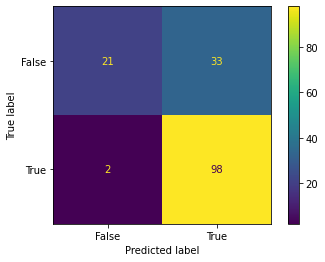

GridSearch/RandomForest
Model accuracy of <class 'sklearn.pipeline.Pipeline'> is 0.78
              precision    recall  f1-score   support

           N       0.92      0.41      0.56        54
           Y       0.75      0.98      0.85       100

    accuracy                           0.78       154
   macro avg       0.84      0.69      0.71       154
weighted avg       0.81      0.78      0.75       154





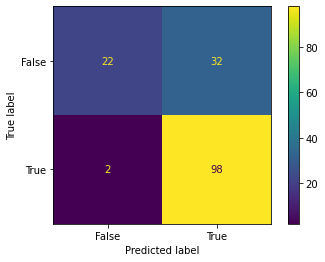

RandomSearch/RandomForest
Model accuracy of <class 'sklearn.pipeline.Pipeline'> is 0.77
              precision    recall  f1-score   support

           N       0.91      0.39      0.55        54
           Y       0.75      0.98      0.85       100

    accuracy                           0.77       154
   macro avg       0.83      0.68      0.70       154
weighted avg       0.81      0.77      0.74       154





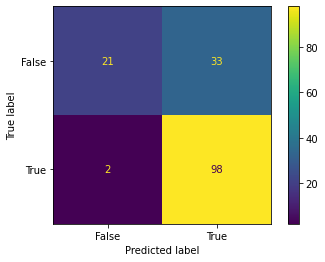

In [140]:
counter = 0
for model in models:
    model.fit(X_train1,y_train1) # fit the model
    y_pred = model.predict(X_test) # predict on test set
    accuracy = accuracy_score(y_test, y_pred)# this gives us how often the model predicted correctly
    clf_report = classification_report(y_test, y_pred)#gives precision and recall
    if counter < 1:
        print('Logisitic Regression')
        counter += 1
    elif counter == 1:
        print('GridSearch/RandomForest')
        counter += 1
    else:
        print('RandomSearch/RandomForest')
    print(f'Model accuracy of {type(model)} is {accuracy:.2f}')
    print(clf_report)
    print('\n')
    cm = confusion_matrix(y_test,y_pred)
    cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = cm,
                                       display_labels = [False,True])
    cm_display.plot()
    plt.show()

From the data produced above we find that we get the best results from RandomForestClassifier using GridSearchCV, which gives us 78% accuracy. However, that approach only gives a 1% increase in accuracy in comparison to the other two Models used which had identical results in all categories. The following discussion will address the results of the RandomForestClassifier using GridSearchCV model.

This is a classification model used on an imbalanced dataset, so we looked at our results from the F1 score to get the harmonic mean of both precision and recall as under these circumstances it is usually more reliable than the accuracy metric which we addresed above.

When identifying 'N' (loan application denied), model performance was 'OK' at 56%

When identifying 'Y' (loan application appproved), model performane was 'Good' at 86%

Accordingly this model performs well at classifying whether a loan application should be denied or approved.

#### Additional Information

In [142]:
report = ProfileReport(df)
report.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]